## Load data

In [2]:
import pandas as pd
# read in phenotyping table
cell_data = pd.read_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/cell_table_final.csv')
cell_data = cell_data[cell_data.final_cell_type != 'exclude'] # remove filtered cells

# table to match the sample names - from raw to final
sample_list = ["Control_12", "Control_13", "Control_14", "4h_96", "4h_97", "24h_83", "24h_86", "48h_76", "48h_79"] # list of sample names as specified in the files
sample_matching = pd.read_csv('/Users/kbestak/Documents/kbestak/phd/heart_manuscript_revision/sample_name_matching.csv') # table with local paths and sample name mappings
sample_list_final = [sample_matching.loc[sample_matching['sample_kb'] == sample, 'sample_final'].values[0] for sample in sample_list] # initialize sample list with final sample names
image_path_list = [sample_matching.loc[sample_matching['sample_kb'] == sample, 'image_path'].values[0] for sample in sample_list]
fov_mapping = dict(zip(sample_matching['sample_kb'], sample_matching['sample_final']))
cell_data['fov_final'] = cell_data['fov'].map(fov_mapping) 

# this table contains both initial and final sample names, as well as the 
# respective path to the autofluroescence corrected images acquired by 
# performing autofluorescence subtraction using Backsub within MCMICRO 
# (Schapiro et al., 2022) on the available raw data.
sample_matching

,sample_kb,sample_final,image_path
0,Control_12,sample_control.r2,/Volumes/Luna_heart/background_subtracted/Cont...
1,Control_13,sample_control.r1,/Volumes/Luna_heart/background_subtracted/Cont...
2,Control_14,sample_control.r3,/Volumes/Luna_heart/background_subtracted/Cont...
3,4h_96,sample_4h.r2,/Volumes/Luna_heart/background_subtracted/4h_9...
4,4h_97,sample_4h.r1,/Volumes/Luna_heart/background_subtracted/4h_9...
5,24h_83,sample_1d.r1,/Volumes/Luna_heart/background_subtracted/24h_...
6,24h_86,sample_1d.r2,/Volumes/Luna_heart/background_subtracted/24h_...
7,48h_76,sample_2d.r2,/Volumes/Luna_heart/background_subtracted/48h_...
8,48h_79,sample_2d.r1,/Volumes/Luna_heart/background_subtracted/48h_...


## Figure 4a,b and Appendix Figure 5

In [3]:
import matplotlib.pyplot as plt

def plot_cell_centroids(
    cell_data_subset, target_type1, target_type2, sample, point_size=1, color1='red', color2='yellow', tag=""):
    """
    Plots the centroids of different cell types within a given sample.

    Parameters:
    -----------
    cell_data_subset : pandas.DataFrame
        A subset of the cell data containing at least the columns:
        'final_cell_type', 'X_centroid', and 'Y_centroid'.
    target_type1 : str
        The first target cell type to highlight.
    target_type2 : str
        The second target cell type to highlight.
    sample : str
        The sample identifier for the plot title and file name.
    point_size : int, optional (default=1)
        The size of the scatter plot points.
    color1 : str, optional (default='red')
        The color used for `target_type1` cells.
    color2 : str, optional (default='yellow')
        The color used for `target_type2` cells.
    tag : str, optional (default="")
        A prefix tag for the output file name.

    Saves:
    ------
    A scatter plot of cell centroids with `target_type1` and `target_type2` highlighted
    while other cell types are shown in gray. The plot maintains aspect ratio and is
    saved as a PNG file.
    """
    
    # Separate cell types for plotting
    other_cells = cell_data_subset.loc[~cell_data_subset['final_cell_type'].isin([target_type1, target_type2])]
    target1_cells = cell_data_subset.loc[cell_data_subset['final_cell_type'] == target_type1]
    target2_cells = cell_data_subset.loc[cell_data_subset['final_cell_type'] == target_type2]

    # Maintain aspect ratio
    plt.figure(figsize=(10, 10))
    plt.gca().set_aspect('equal', adjustable='box')
    
    # Plot cell centroids
    plt.scatter(other_cells.X_centroid, other_cells.Y_centroid, color='gray', s=point_size)
    plt.scatter(target1_cells.X_centroid, target1_cells.Y_centroid, color=color1, s=point_size)
    plt.scatter(target2_cells.X_centroid, target2_cells.Y_centroid, color=color2, s=point_size)
    
    # Format plot
    plt.axis('off')
    plt.title(f'{sample}: {target_type1} vs {target_type2}')

    # Format file names for special cases
    target1_name = target_type1.split(" ")[0]
    if target_type1 == 'Cardiomyocytes Ankrd1+':
        target1_name = 'CMankrd1'
    target2_name = target_type2.split(" ")[0]
    if target_type2 == 'Cardiomyocytes Ankrd1+':
        target2_name = 'CMankrd1'
    
    # Save the plot
    plt.savefig(f'/Users/kbestak/Documents/kbestak/phd/dirSEA/scatterplots/{tag}{sample}_{target1_name}{color1}_{target2_name}{color2}_cell_centroids.svg')


def update_subset(cell_data, sample_final, coords_ROI=None):
    """
    Extracts a subset of cell data for a given sample and flips the Y-coordinates.

    Parameters:
    -----------
    cell_data : pandas.DataFrame
        The full cell dataset containing at least the columns 'fov' and 'Y_centroid'.
    sample : str
        The sample identifier to filter the data.

    Returns:
    --------
    pandas.DataFrame
        A subset of `cell_data` where `fov` matches `sample`, with Y-coordinates flipped.
    """
    
    cell_data_subset = cell_data.loc[cell_data['fov_final'] == sample_final].copy()
    if coords_ROI is not None:
        cell_data_subset = cell_data_subset.loc[(cell_data_subset['X_centroid'] >= coords_ROI[0]) & 
                                                (cell_data_subset['X_centroid'] < coords_ROI[1]) &
                                                (cell_data_subset['Y_centroid'] >= coords_ROI[2]) &
                                                (cell_data_subset['Y_centroid'] < coords_ROI[3])]
    cell_data_subset['Y_centroid'] = max(cell_data_subset['Y_centroid']) - cell_data_subset['Y_centroid']
    return cell_data_subset

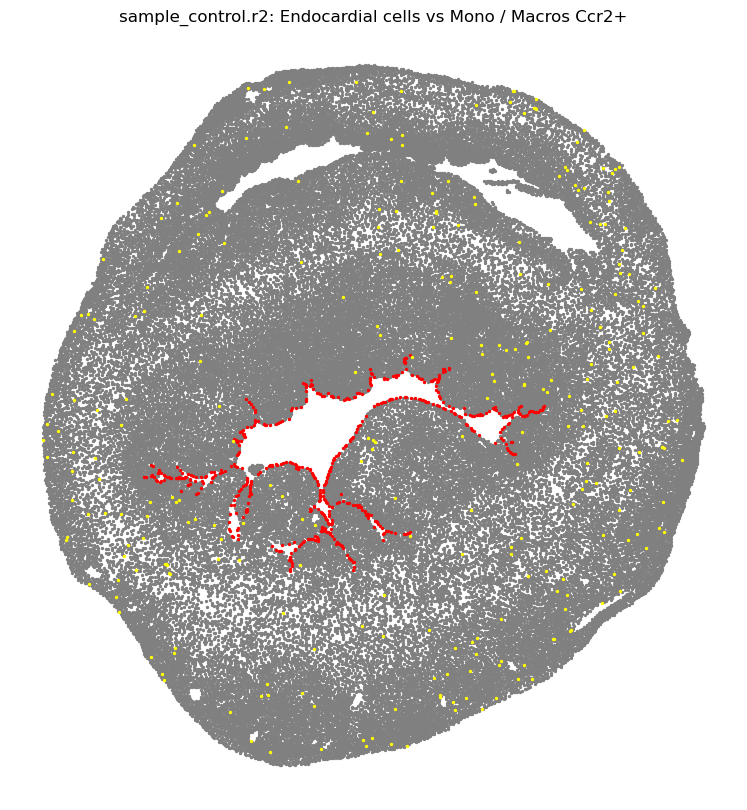

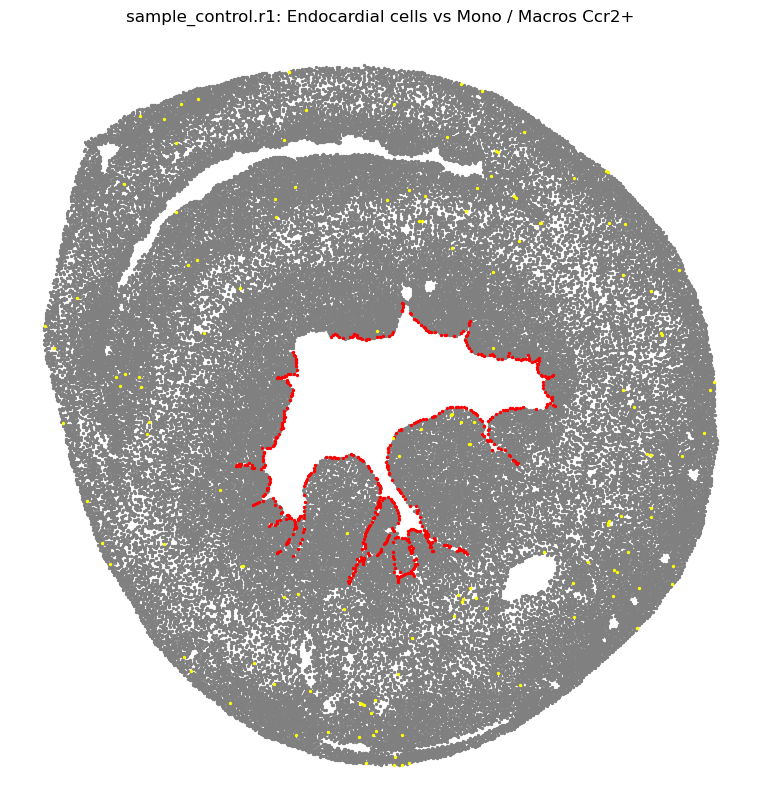

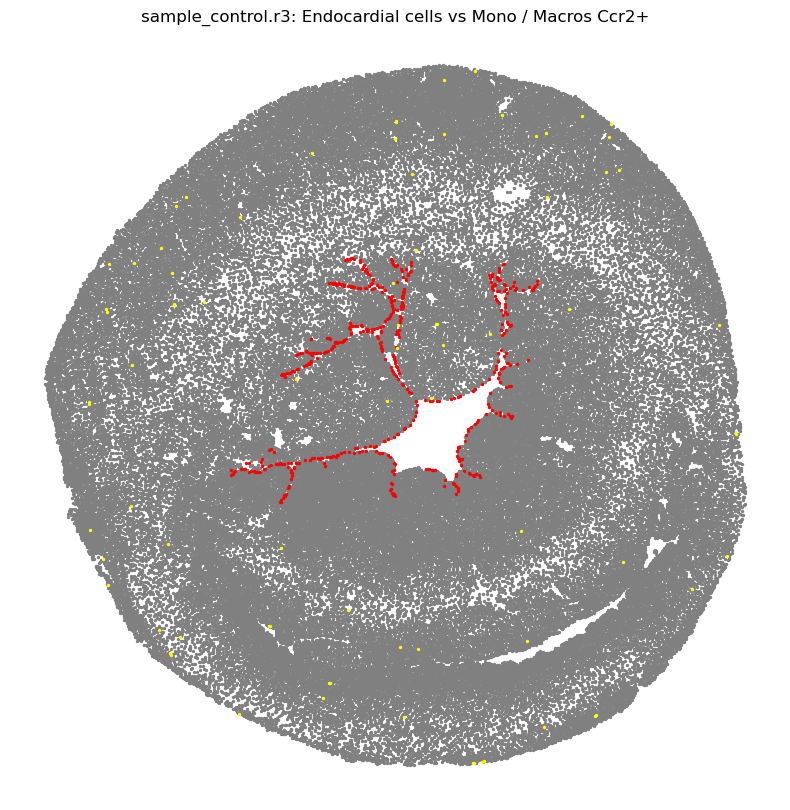

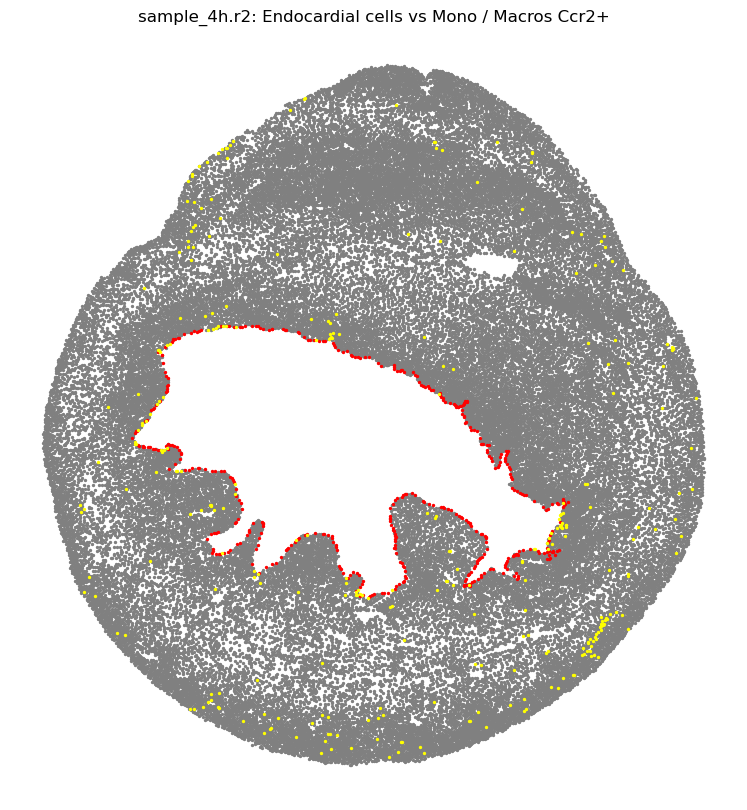

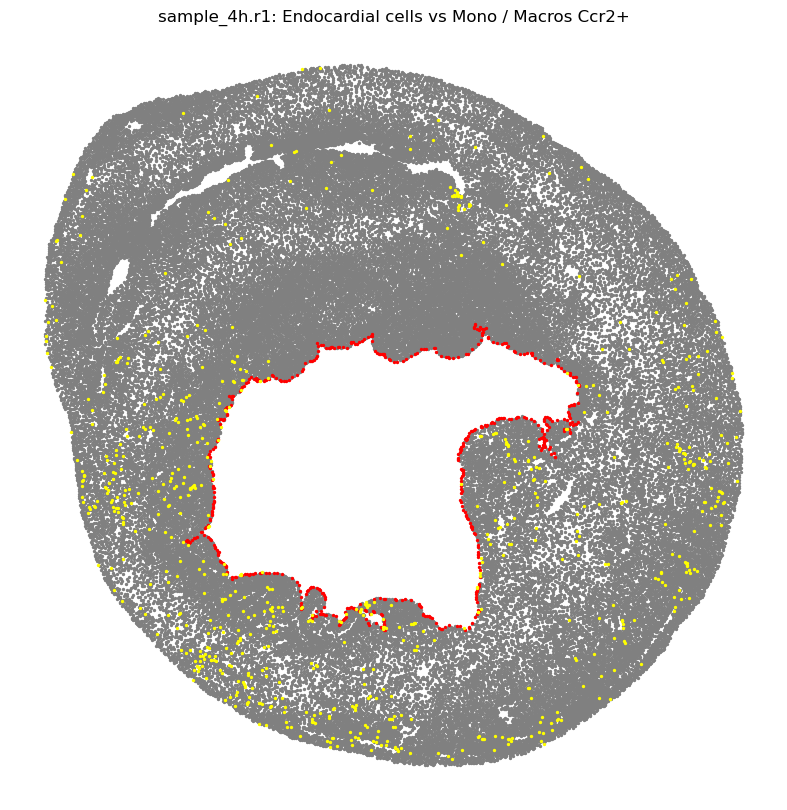

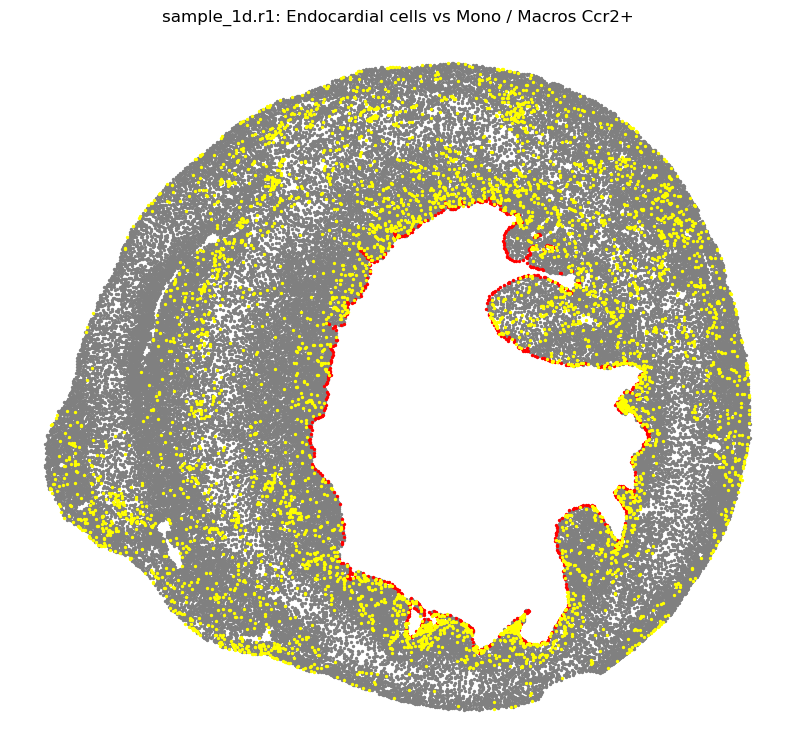

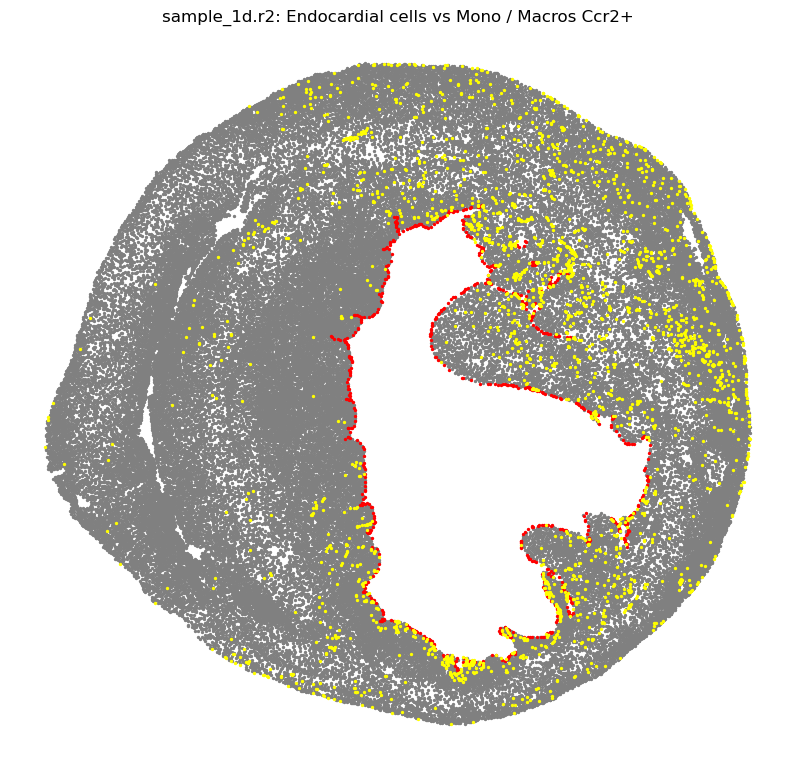

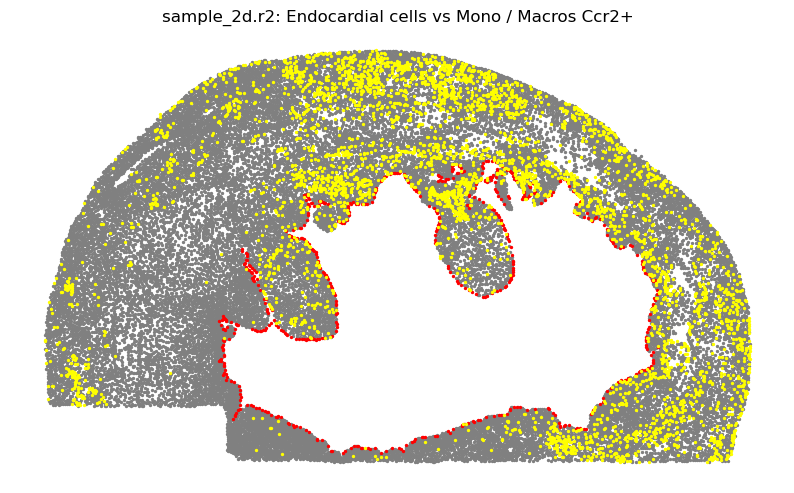

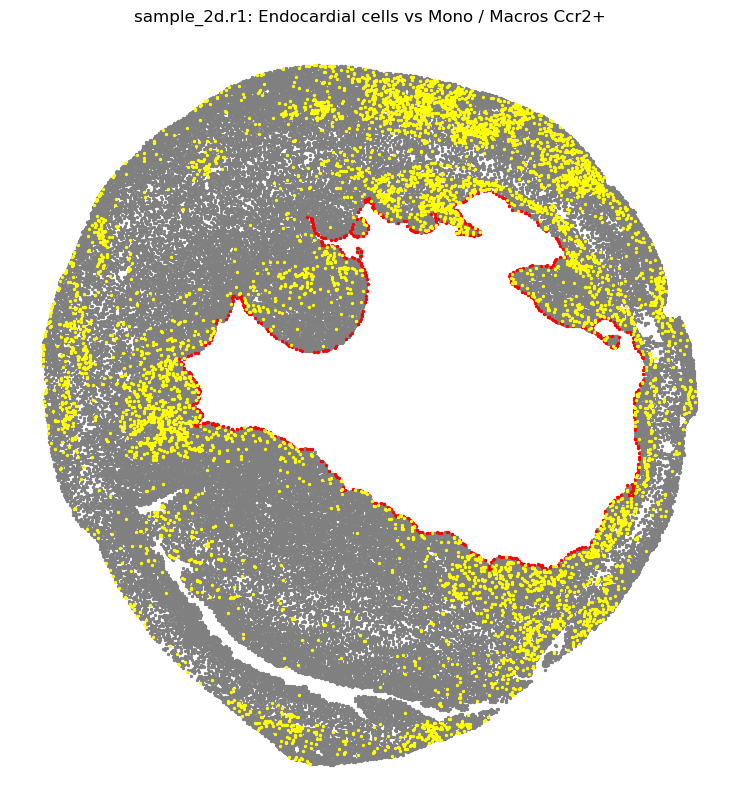

In [3]:
# Monocytes in yellow, Endocardial cells in red, others gray -- crop specific image
target_type1 = 'Endocardial cells'
target_type2 = 'Mono / Macros Ccr2+'
for sample in sample_list_final:
    cell_data_subset = update_subset(cell_data, sample)
    plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=2, color1='red', color2='yellow', tag="")

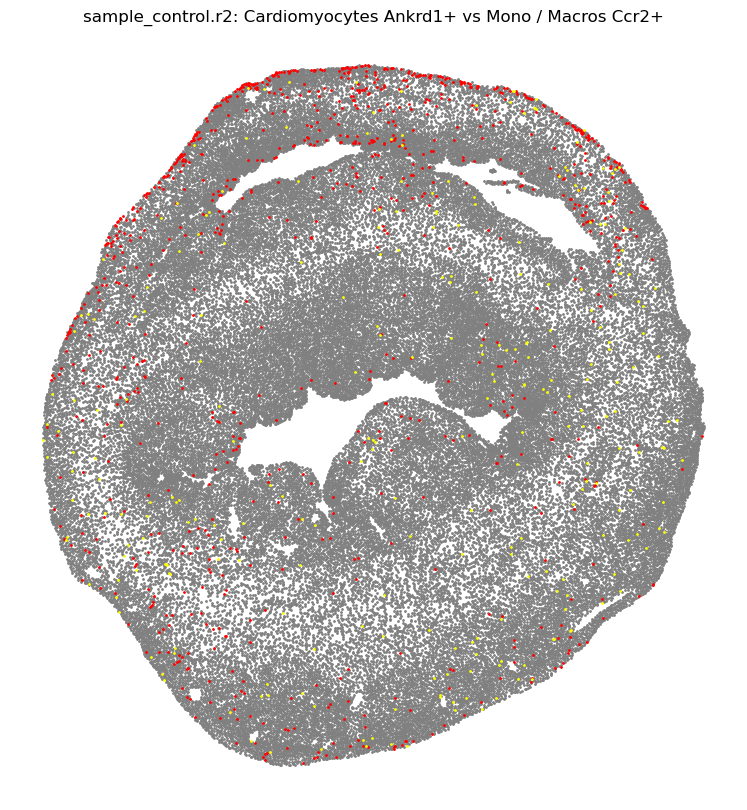

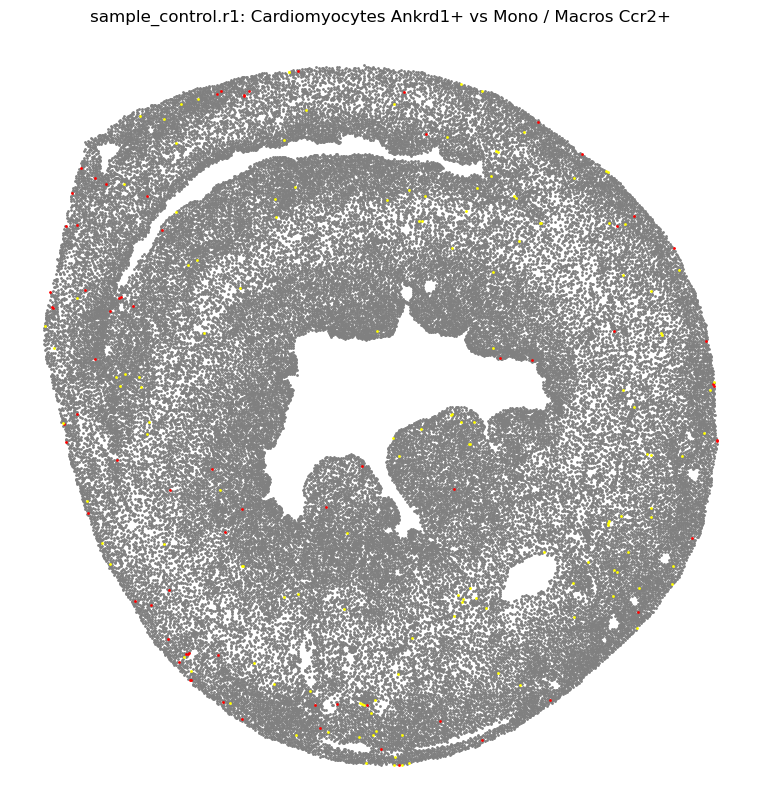

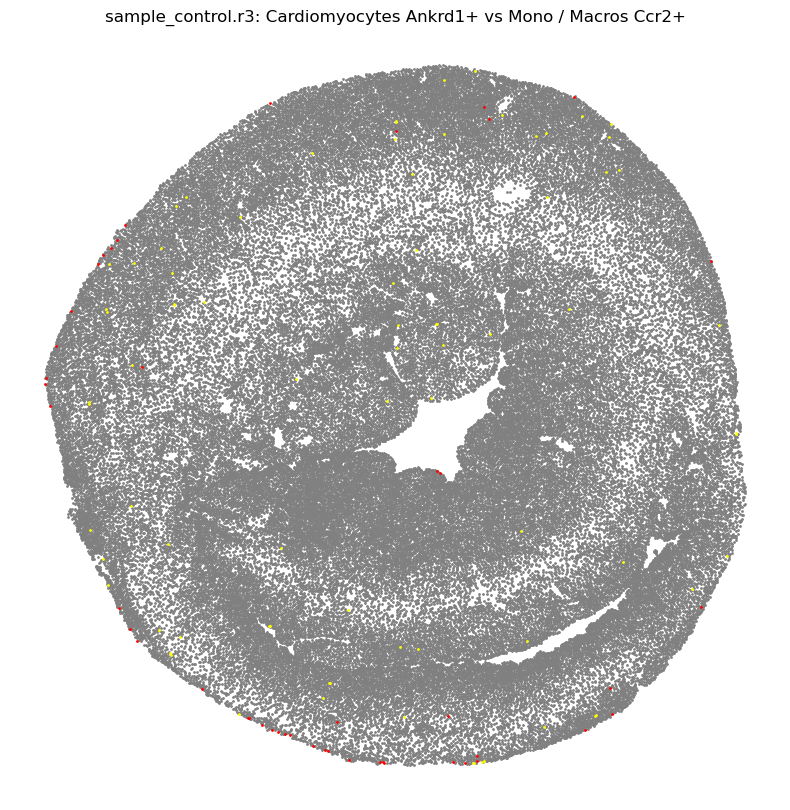

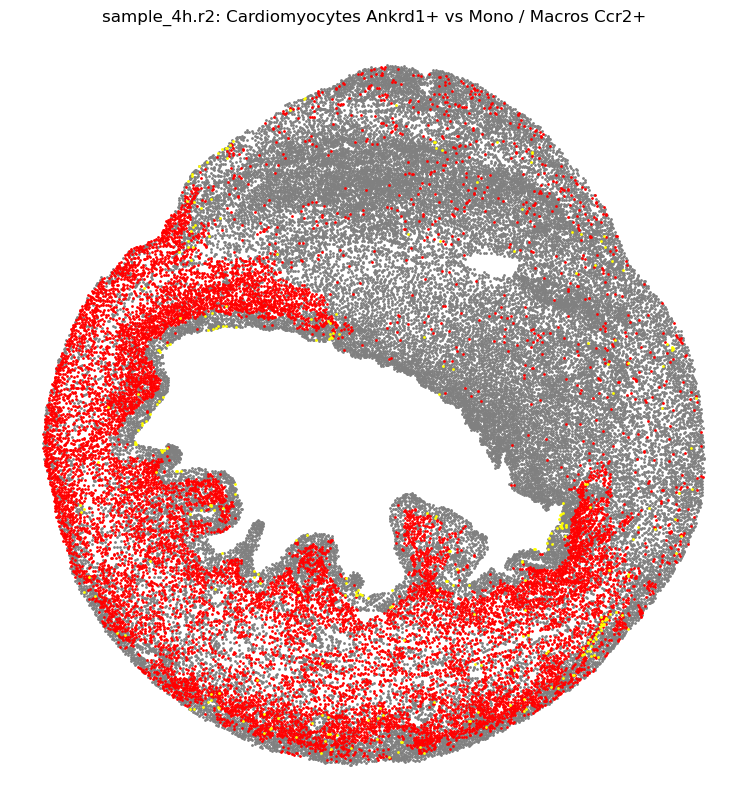

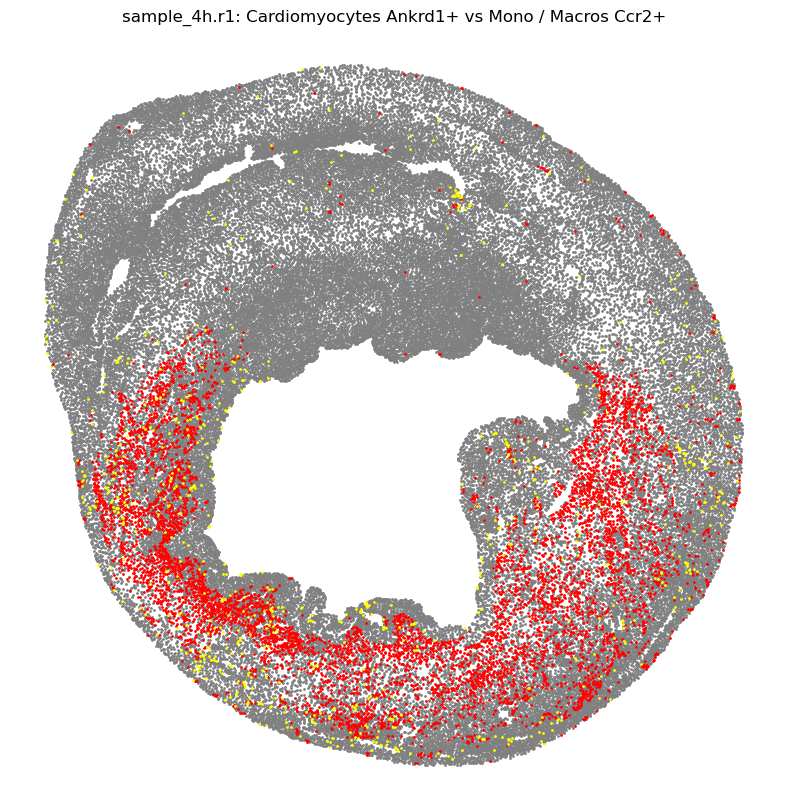

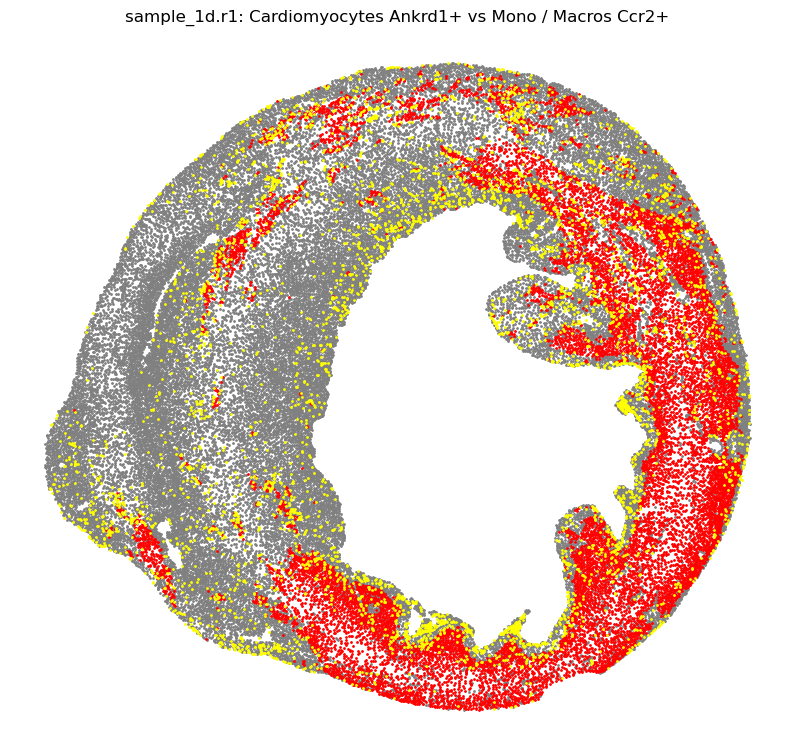

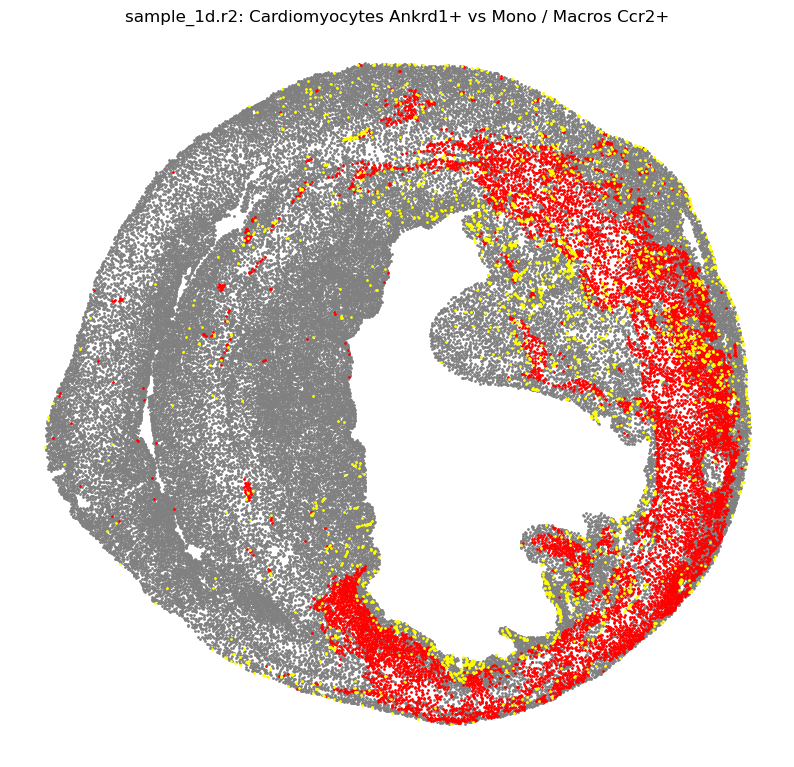

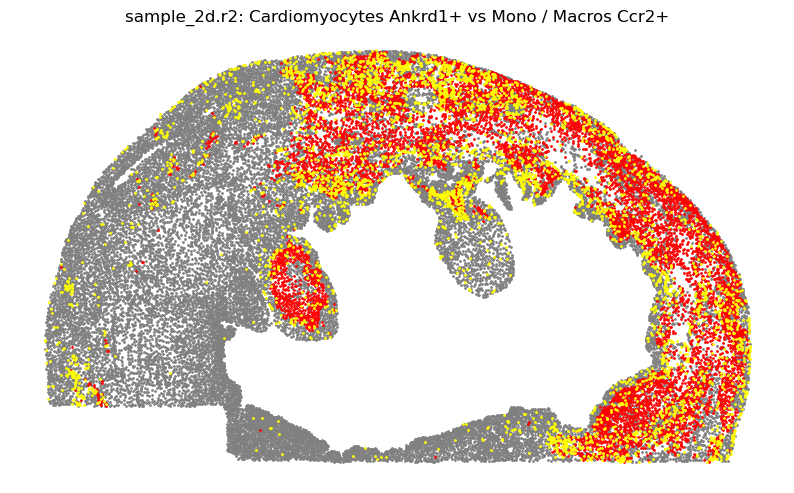

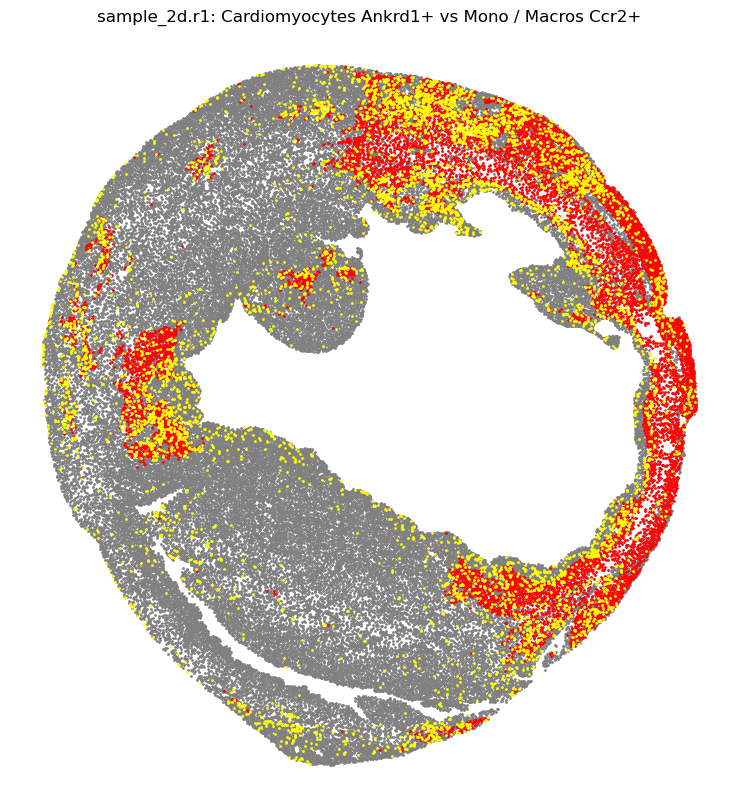

In [5]:
# Monocytes in yellow, Stressed cardiomyocytes in red, others gray
target_type1 = 'Cardiomyocytes Ankrd1+'
target_type2 = 'Mono / Macros Ccr2+'
for sample in sample_list_final:
    cell_data_subset = update_subset(cell_data, sample)
    plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=1, color1='red', color2='yellow', tag="")

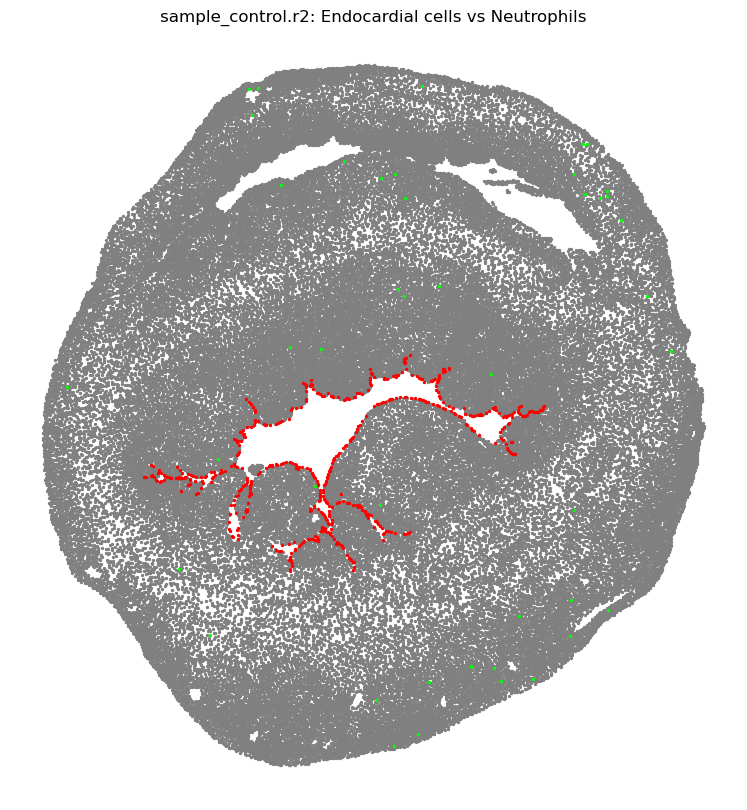

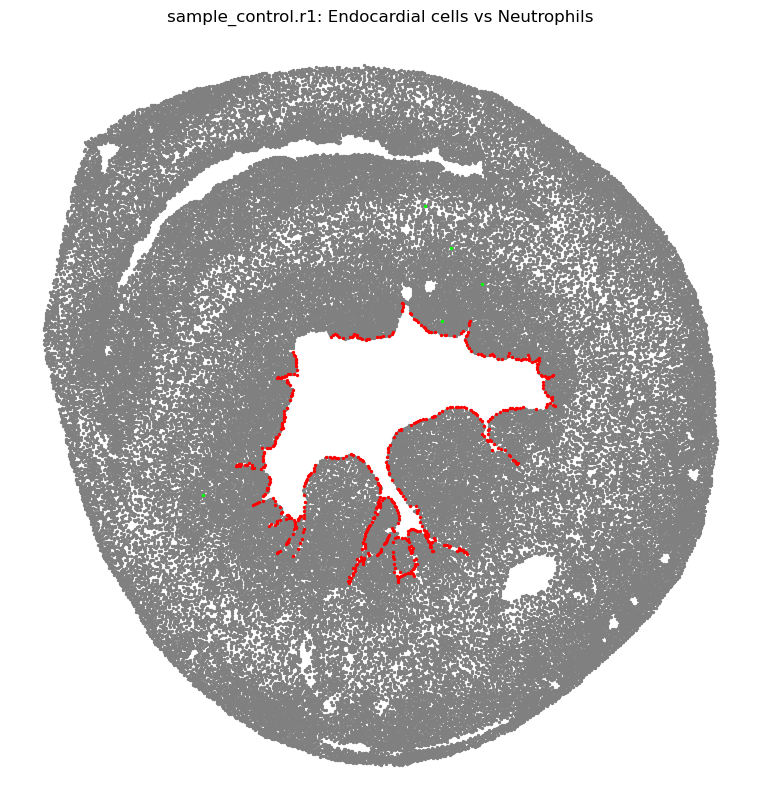

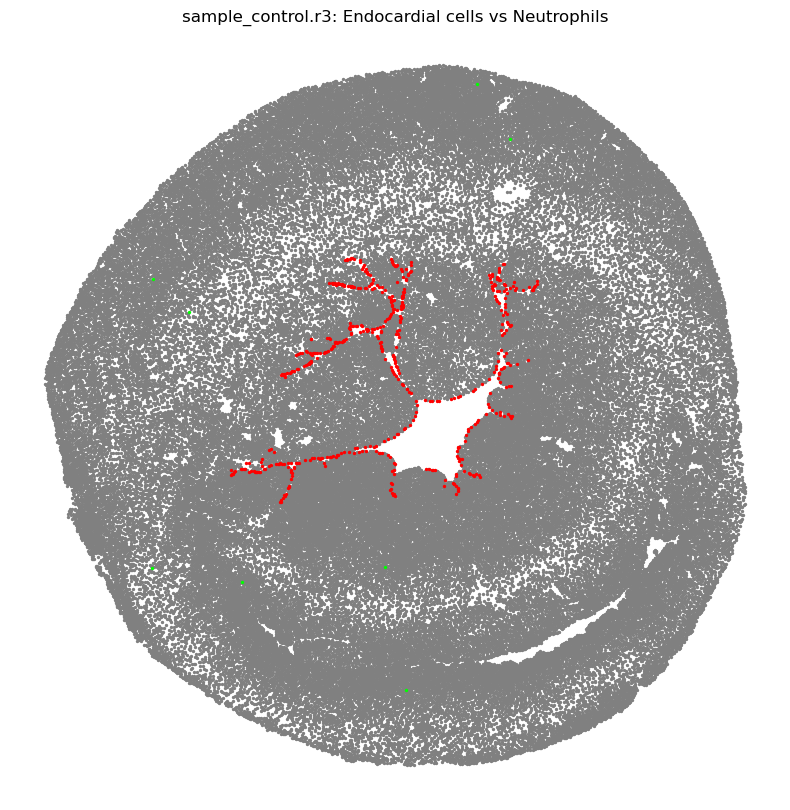

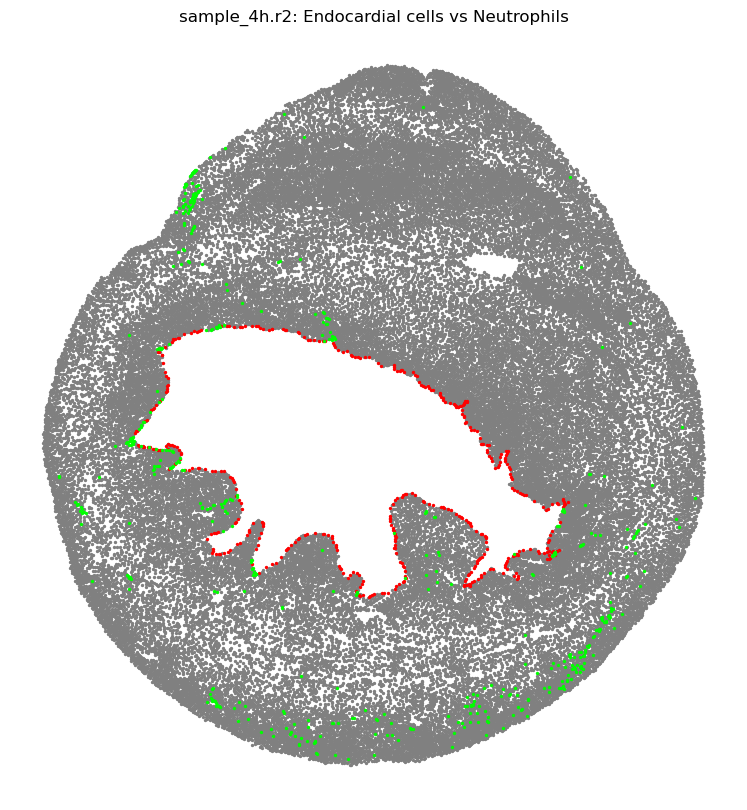

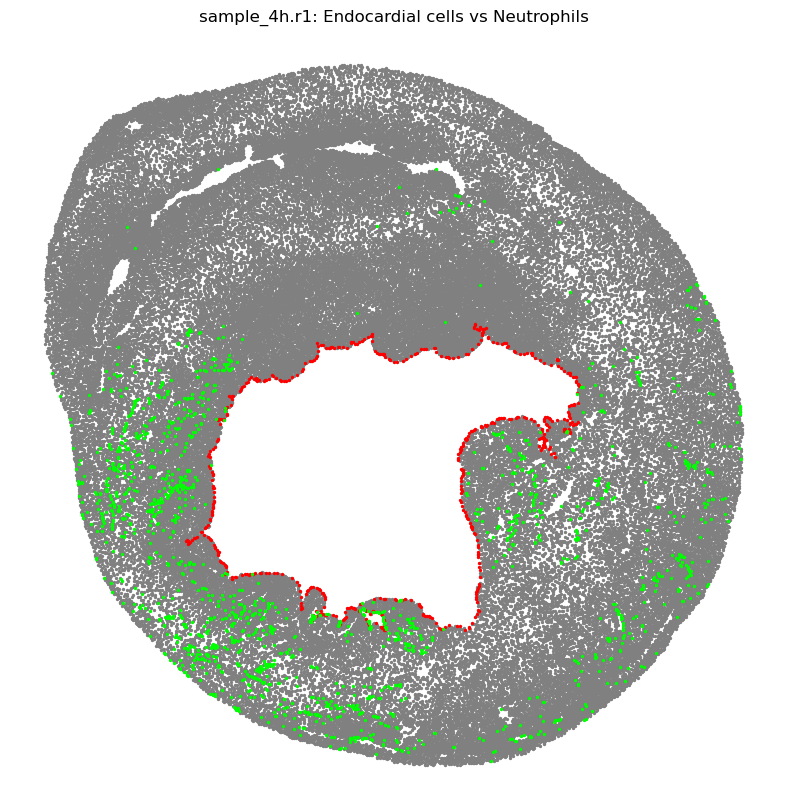

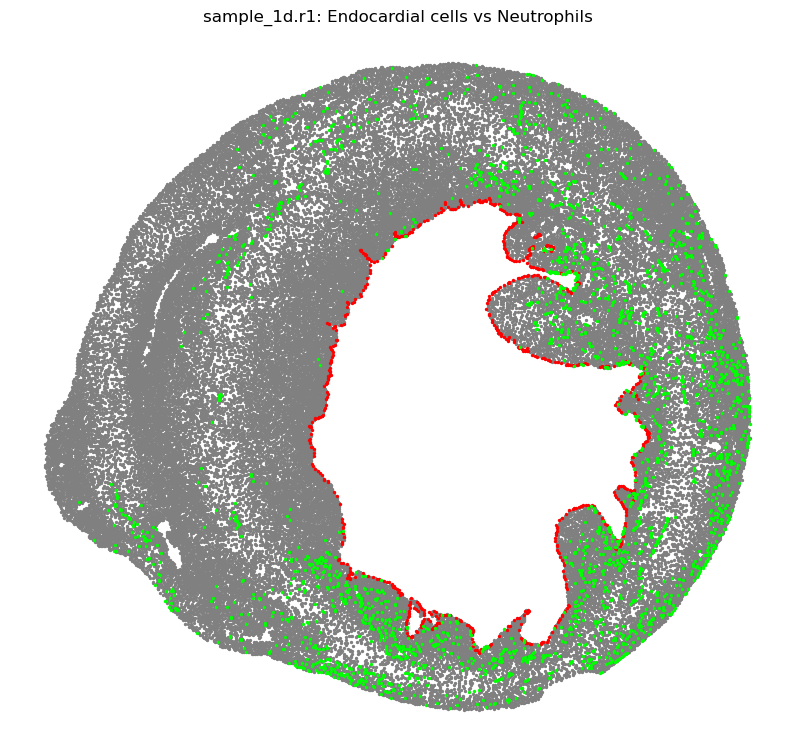

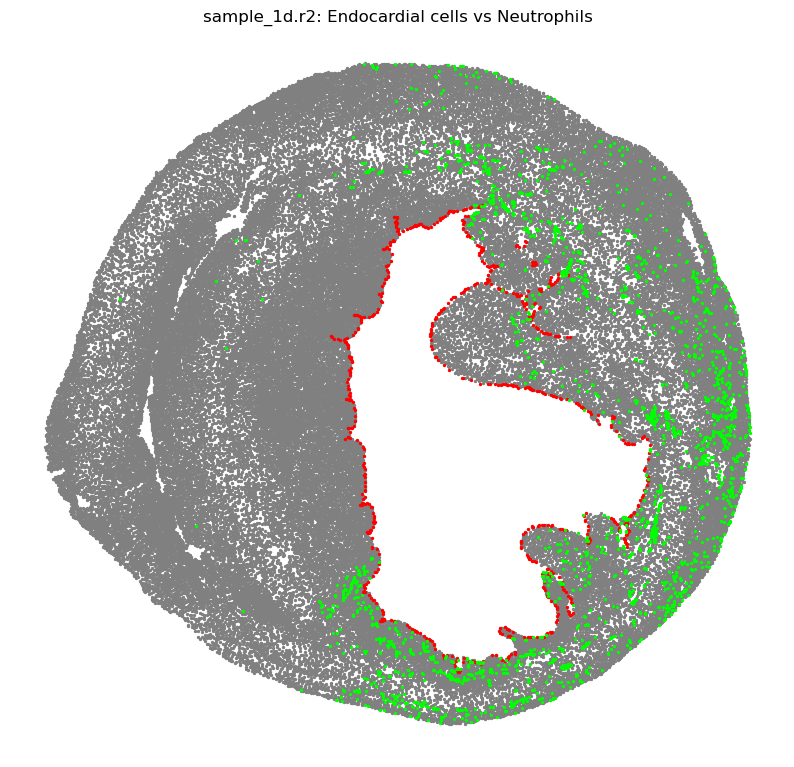

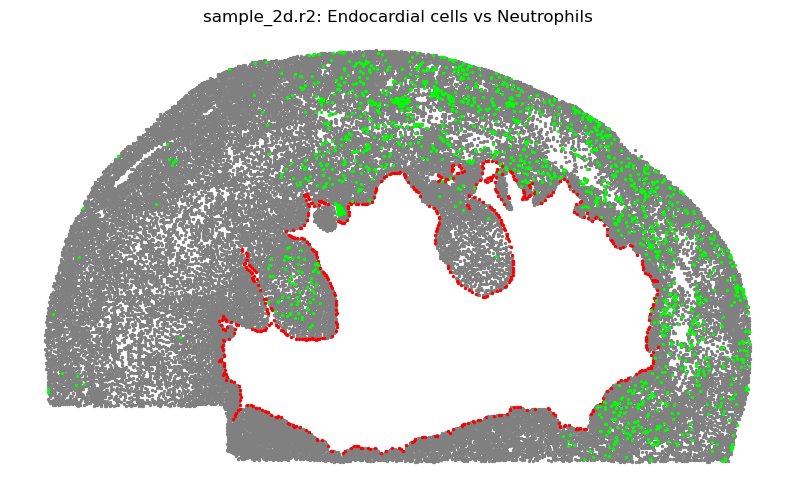

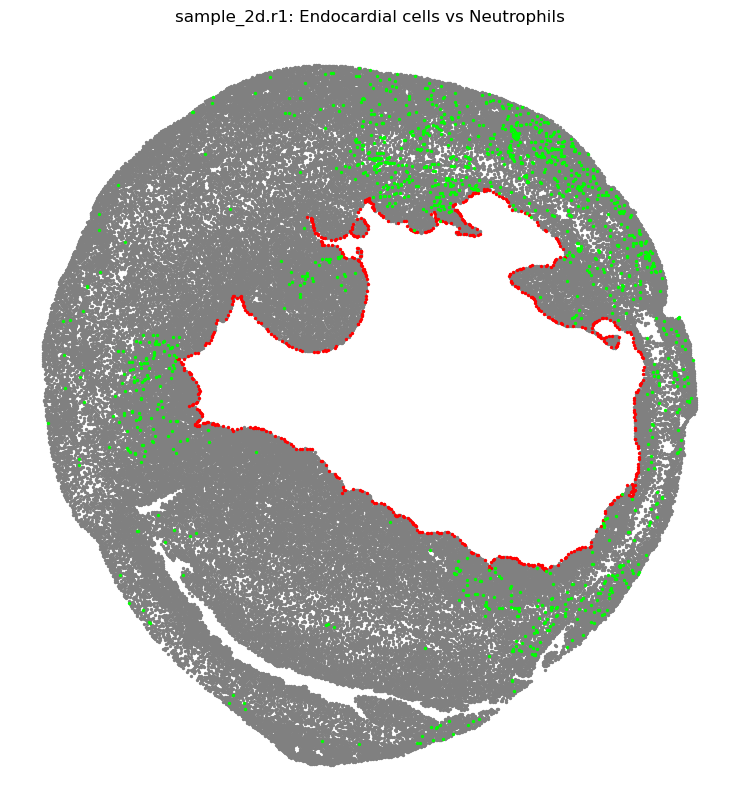

In [5]:
target_type1 = 'Endocardial cells' # -- crop specific images
target_type2 = 'Neutrophils'
for sample in sample_list_final:
    cell_data_subset = update_subset(cell_data, sample)
    plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=2, color1='red', color2='lime', tag="")

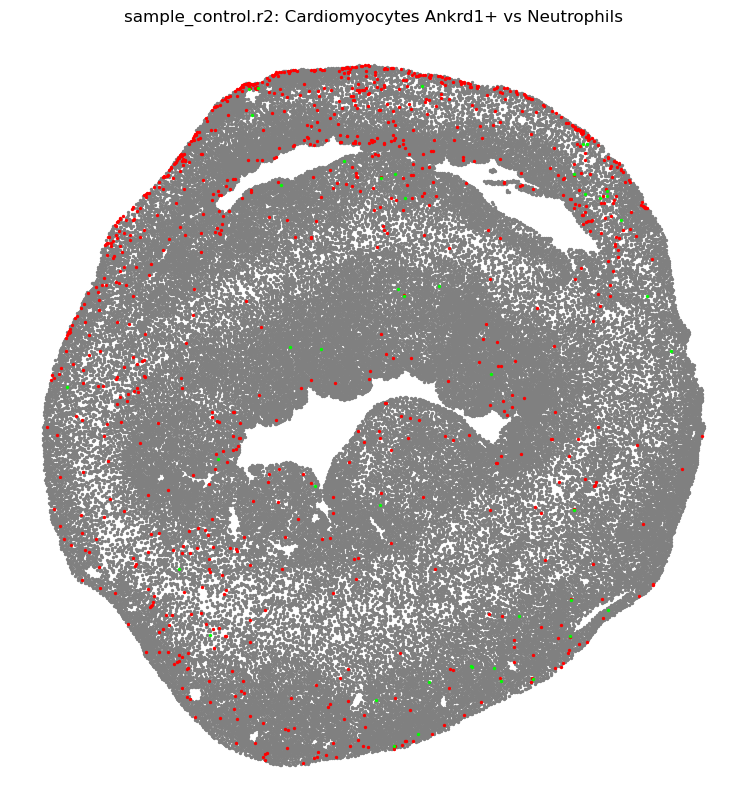

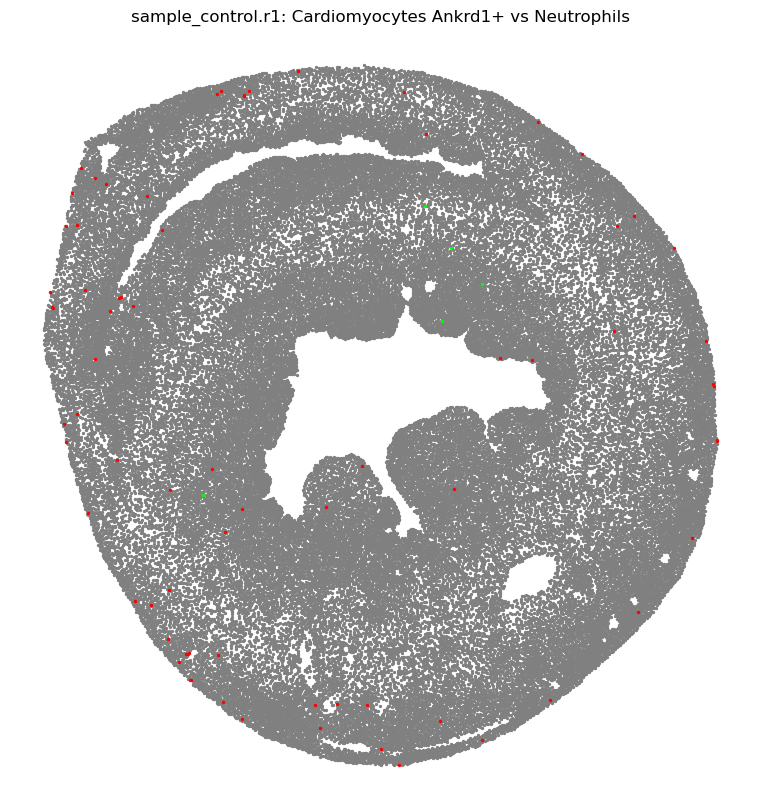

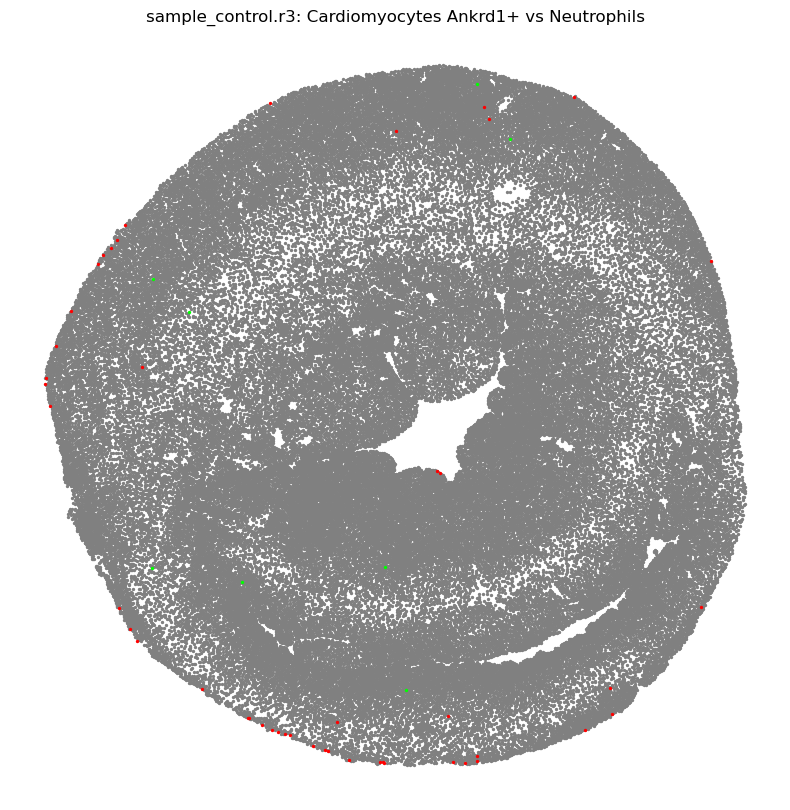

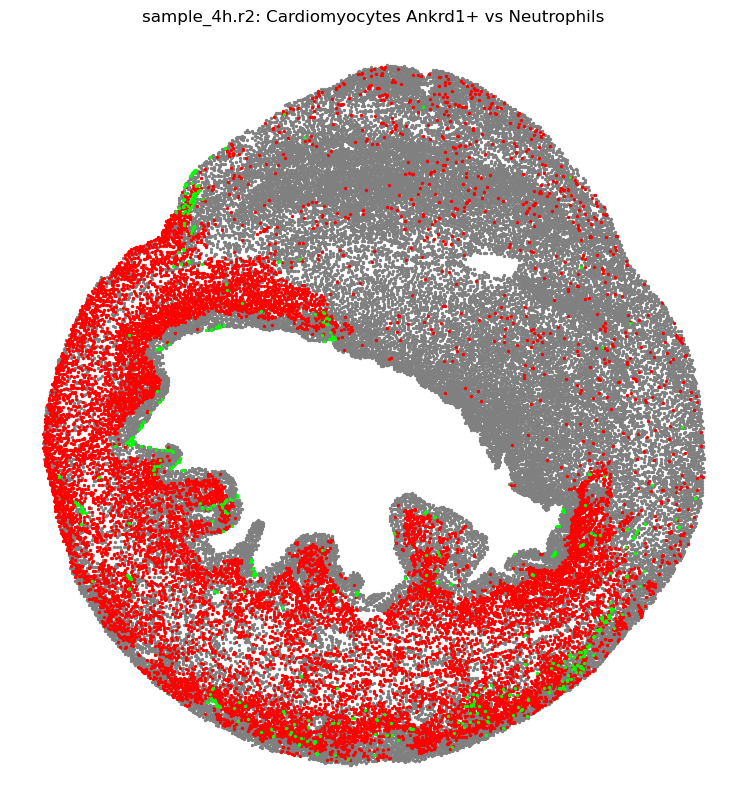

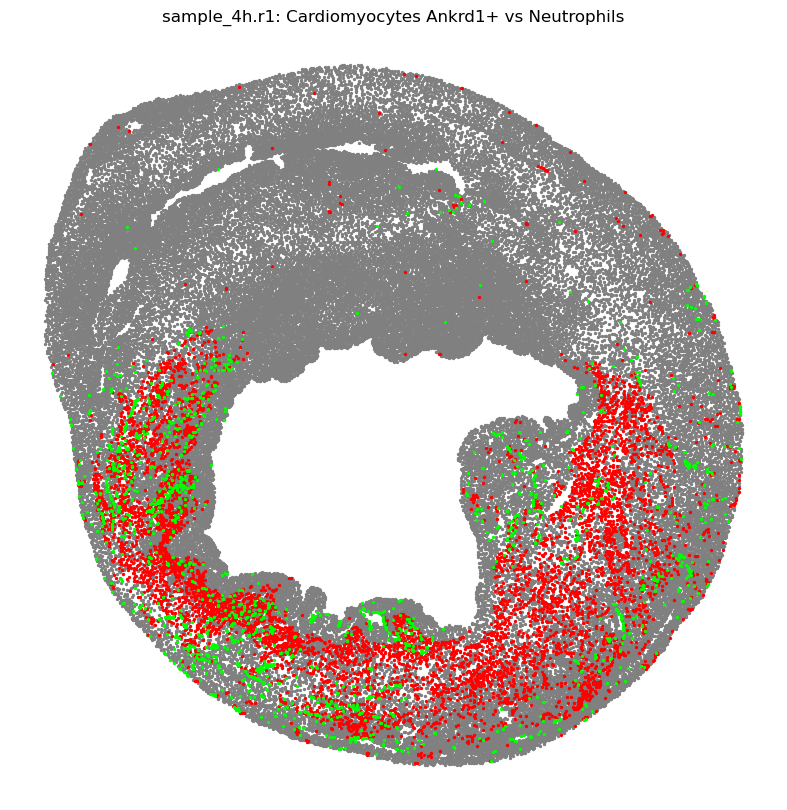

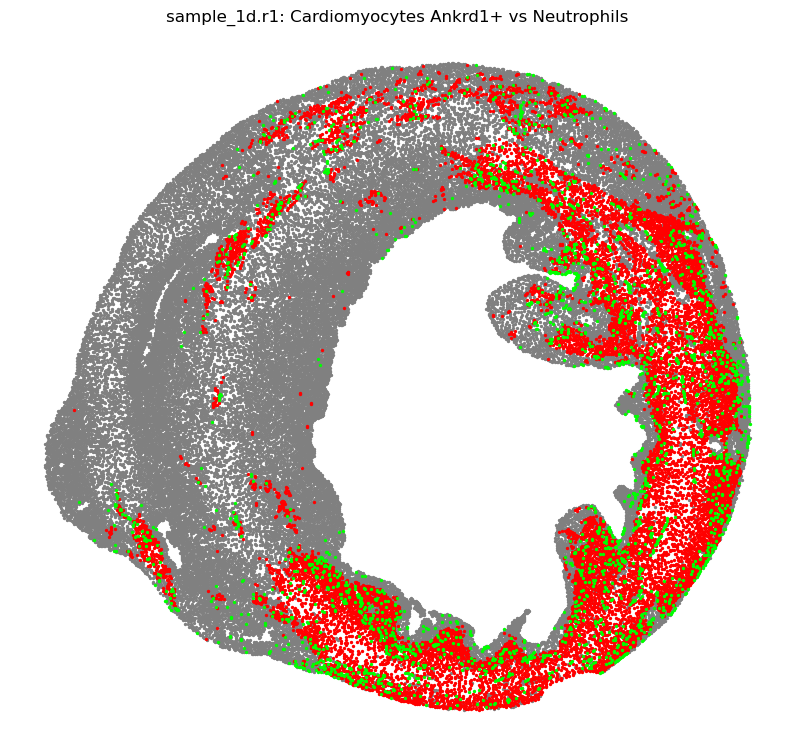

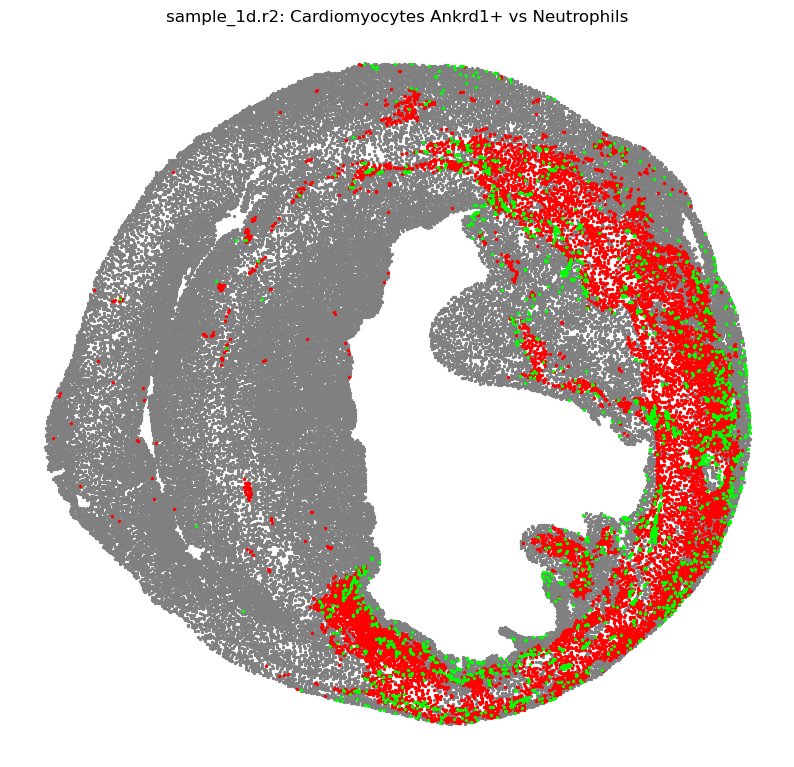

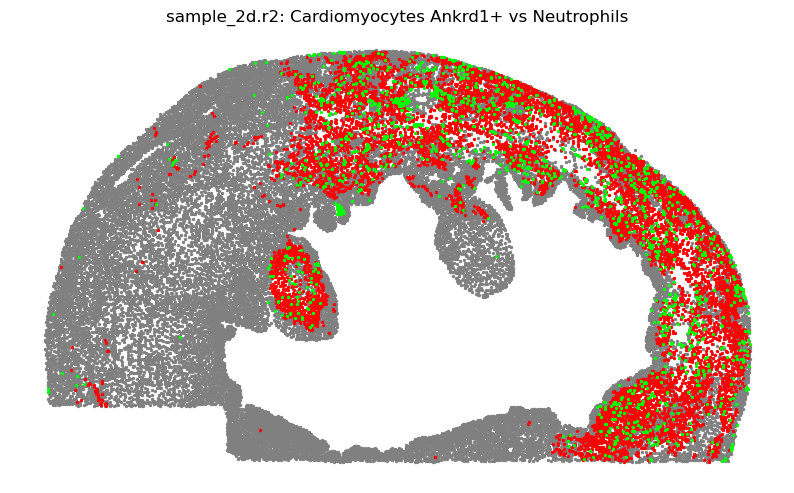

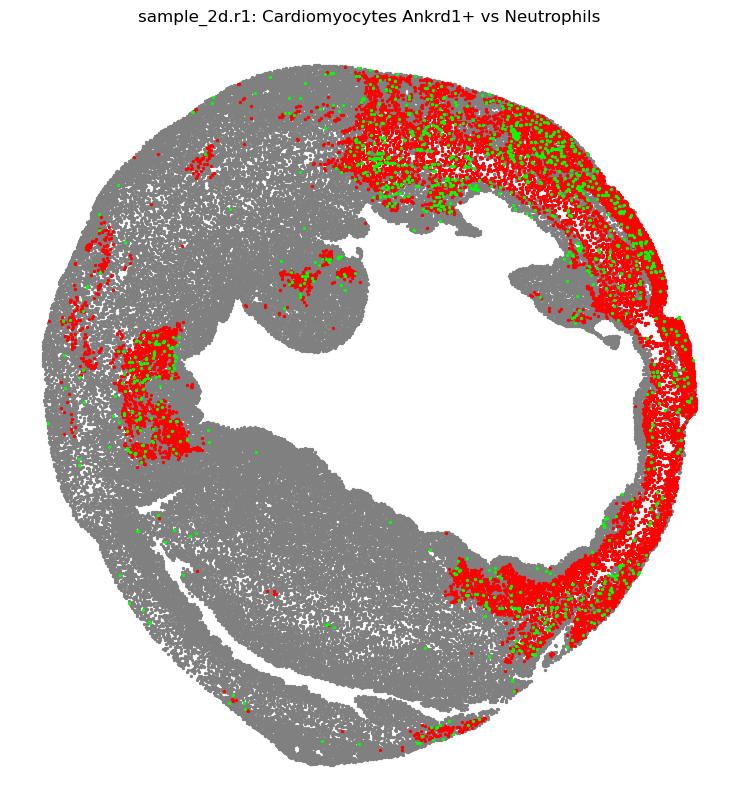

In [6]:
# Neutrophils in green, Stressed cardiomyocytes in red, others gray
target_type1 = 'Cardiomyocytes Ankrd1+'
target_type2 = 'Neutrophils'
for sample in sample_list_final:
    cell_data_subset = update_subset(cell_data, sample)
    plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=2, color1='red', color2='lime', tag="")

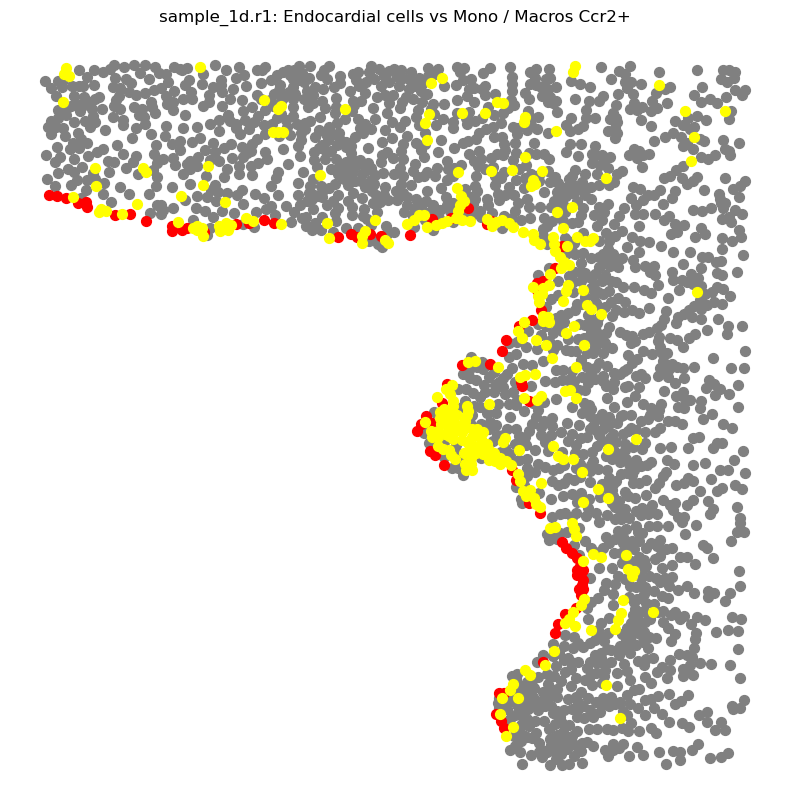

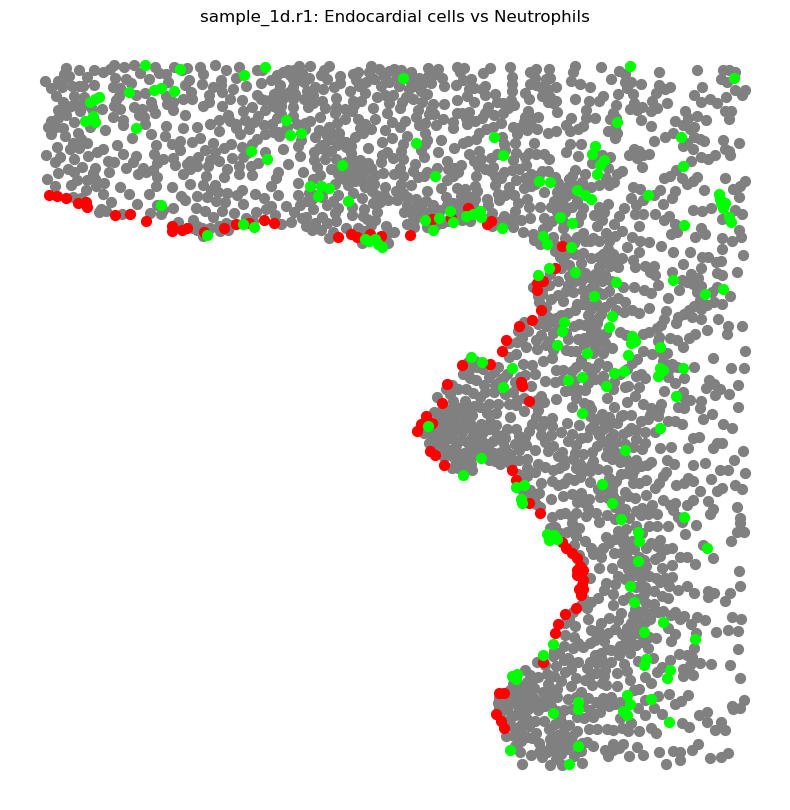

In [5]:
# Monocytes in yellow, Endocardial cells in red, others gray -- crop specific image
target_type1 = 'Endocardial cells'
target_type2 = 'Mono / Macros Ccr2+'
sample = 'sample_1d.r1'
coords = [17100, 21600, 13700, 18200]
cell_data_subset = update_subset(cell_data, sample, coords)
plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=50, color1='red', color2='yellow', tag="1d_roi")
target_type2 = 'Neutrophils'
plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=50, color1='red', color2='lime', tag="1d_roi")

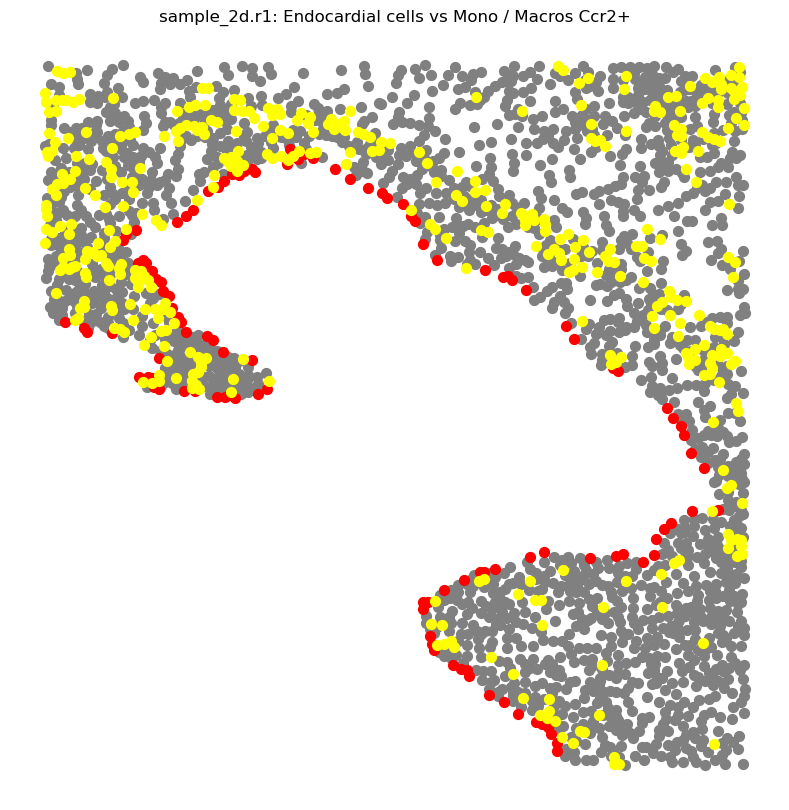

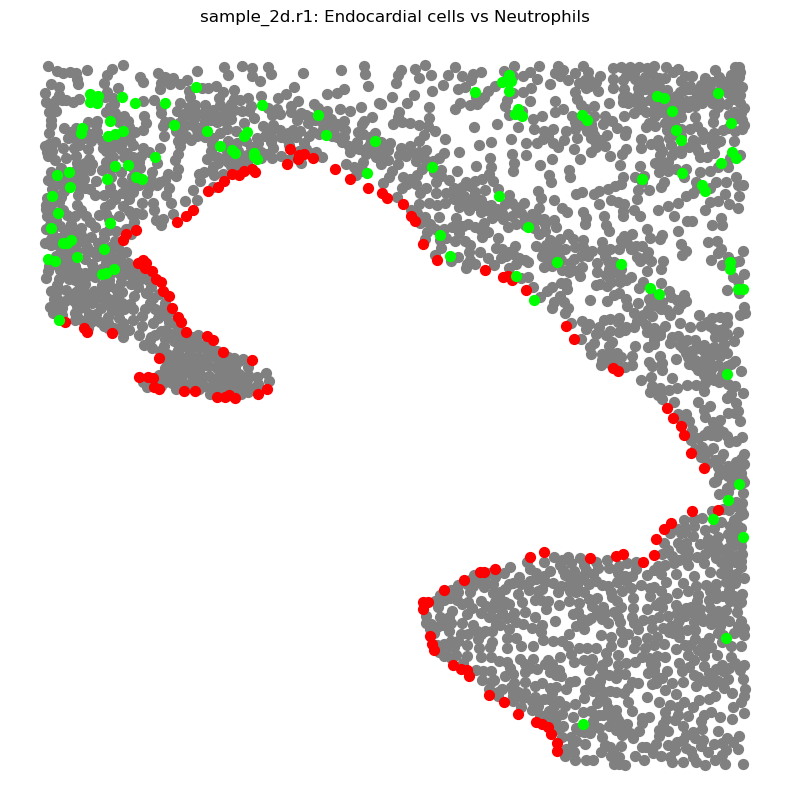

In [6]:
# Monocytes in yellow, Endocardial cells in red, others gray -- crop specific image
target_type1 = 'Endocardial cells'
target_type2 = 'Mono / Macros Ccr2+'
sample = 'sample_2d.r1'
coords = [15940, 20440, 8050, 12550]
cell_data_subset = update_subset(cell_data, sample, coords)
plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=50, color1='red', color2='yellow', tag="2d_roi")
target_type2 = 'Neutrophils'
plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=50, color1='red', color2='lime', tag="2d_roi")

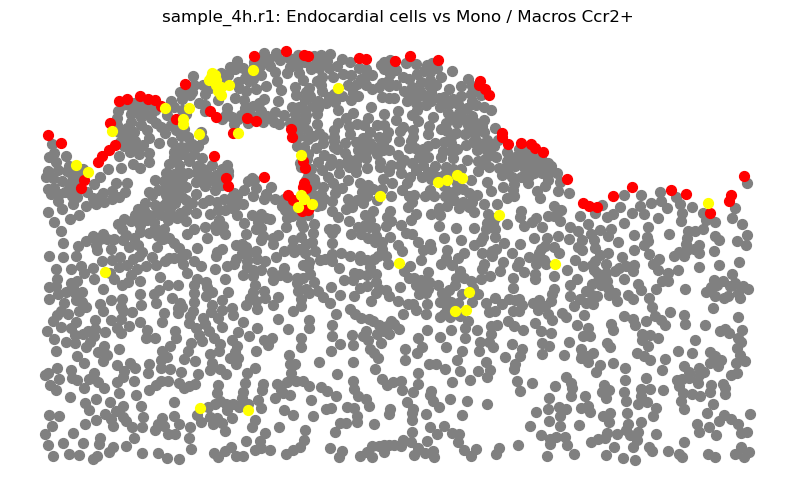

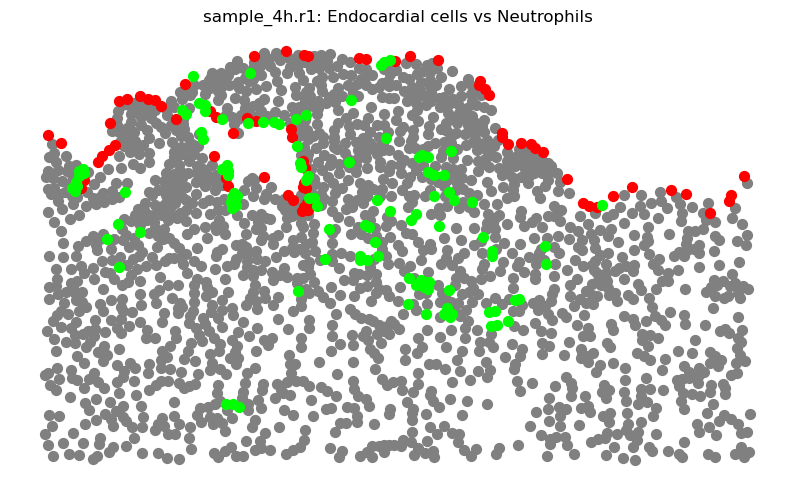

In [7]:
# Monocytes in yellow, Endocardial cells in red, others gray -- crop specific image
target_type1 = 'Endocardial cells'
target_type2 = 'Mono / Macros Ccr2+'
sample = 'sample_4h.r1'
coords = [14100, 18600, 19500, 24000]
cell_data_subset = update_subset(cell_data, sample, coords)
plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=50, color1='red', color2='yellow', tag="4h_roi")
target_type2 = 'Neutrophils'
plot_cell_centroids(cell_data_subset, target_type1, target_type2, sample, point_size=50, color1='red', color2='lime', tag="4h_roi")

## Appendix Figure 7

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
from skimage import exposure

def plot_image(data,
               e_channels, 
               e_coords, 
               e_colors, 
               e_contrast_limits, 
               e_gamma_values,
               scale_bar_length_microns=100,
               save=False,
               save_path=None,
               save_type='png'):
    """
    Plots a multi-channel image with contrast adjustment, gamma correction, and a scale bar.

    Parameters:
    -----------
    data : dask.array or numpy.ndarray
        Multi-channel image data.
    e_channels : list of int
        Indices of channels to visualize.
    e_coords : tuple (x_min, y_min, x_max, y_max)
        Bounding box coordinates for cropping.
    e_colors : list of str
        Colors for each channel (e.g., ['red', 'green', 'blue']).
    e_contrast_limits : list of tuples
        Contrast limits for each channel, e.g., [(min1, max1), (min2, max2)].
    e_gamma_values : list of float
        Gamma correction values for each channel.
    scale_bar_length_microns : float, optional (default=100)
        Length of the scale bar in microns.
    save : bool, optional (default=False)
        Whether to save the image.
    save_path : str, optional (default=None)
        Path to save the image.
    save_type : str, optional (default='png')
        Format for saving ('png' or 'svg').

    Returns:
    --------
    None
    """
    channels = data[e_channels, e_coords[0]:e_coords[2], e_coords[1]:e_coords[3]].compute()

    # Parameters
    colors = e_colors
    contrast_limits = e_contrast_limits
    gamma_values = e_gamma_values
    pixel_size = 0.23  # microns

    # Normalize, gamma correct, and colorize channels
    n_channels, height, width = channels.shape
    rgb_image = np.zeros((height, width, 3), dtype=np.float32)

    # Convert color names to RGB values
    color_rgb_values = [mcolors.to_rgb(color) for color in colors]

    for i in range(n_channels):
        clim = contrast_limits[i]
        channel = np.clip(channels[i], clim[0], clim[1])

        channel = exposure.adjust_gamma(channel, gamma_values[i])
        channel = np.clip((channel - channel.min()) / channel.max(), 0, 1)
        # Apply color
        rgb_image += channel[:, :,np.newaxis] * np.array(color_rgb_values[i])

    # Ensure the RGB image is in [0, 1] range
    rgb_image = np.clip(rgb_image, 0, 1)

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(rgb_image)
    ax.axis('off')

    # Add scale bar
    scale_bar_length_pixels = scale_bar_length_microns / pixel_size
    bar_x = 20 #width - scale_bar_length_pixels - 20  # Offset from the right
    bar_y = height - 20  # Offset from the bottom
    ax.add_patch(plt.Rectangle(
        (bar_x, bar_y), scale_bar_length_pixels, 5,  # 5-pixel height for the bar
        color='white'
    ))
    

    # Save the figure
    if save and save_path is not None:
        if save_type == 'png':    
            # check if save_path ends with png
            if not save_path.endswith('.png'):
                save_path = save_path + '.png'
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        elif save_type == 'svg':
            # check if save_path ends with svg
            if not save_path.endswith('.svg'):
                save_path = save_path + '.svg'
            plt.savefig(save_path, format='svg', dpi=300, bbox_inches='tight')
    plt.show()

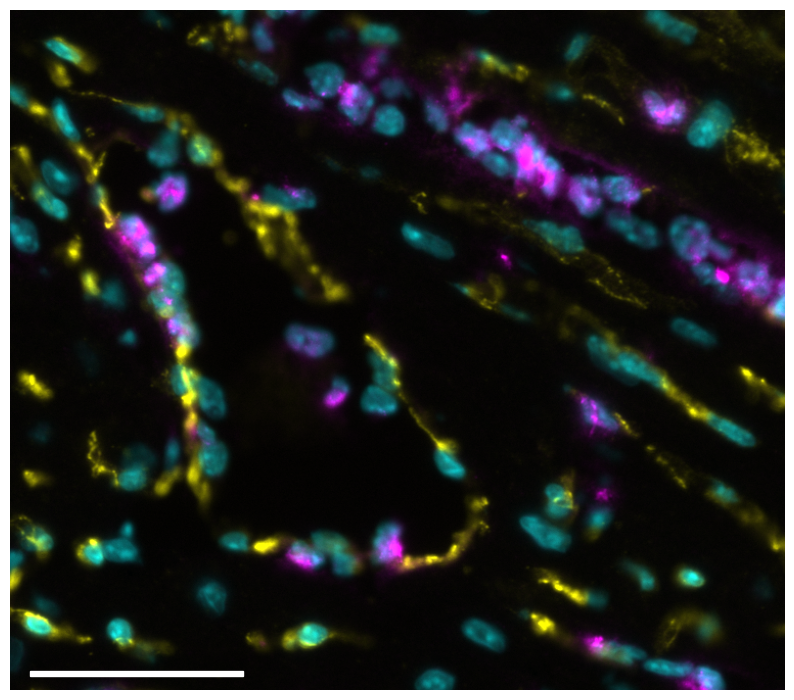

In [15]:
sample = 'sample_4h.r1'
image_path = sample_matching.loc[sample_matching['sample_final'] == sample, 'image_path'].values[0]

# lazy load the data
import zarr
import dask.array
import tifffile

store = tifffile.imread(image_path, aszarr=True)
cache = zarr.LRUStoreCache(store, max_size=2**30)
zobj = zarr.open(cache, mode='r')
data = [
    zobj[int(dataset['path'])]
    for dataset in zobj.attrs['multiscales'][0]['datasets']
]
data = [dask.array.from_zarr(z) for z in data]
n_channels = data[0].shape[0]
data = data[0] # keep only highest resolution level

example_coords = tuple([23805,11094,24500,11886]) # crop to the region of interest
example_channels = [0,5,14] # DAPI, CD31, MPO
example_colors = ['cyan', 'yellow', 'magenta'] # DAPI cyan, CD31 yellow, MPO magenta
example_contrast_limits = [(0, 65535), (0, 65535), (0, 65535)] # no change
example_gamma_values = [1.00, 1.00, 1.00, 1.00, 1.00] # no change
plot_image(data, example_channels, example_coords, example_colors, example_contrast_limits, example_gamma_values, scale_bar_length_microns=50,
           save=True, save_path='/Users/kbestak/Documents/kbestak/phd/dirSEA/image_endothelial_neutros.png', save_type='png')